<a href="https://colab.research.google.com/github/TaniaZharova2205/HSE/blob/main/DZ5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зараплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Как всегда, загрузим набор данных.

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

## **Задание 1 (0.3 балла)**

Вам даны описания переменных. Проверьте, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишите цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [ ]:
columns = {"experience_level": ["SE", "MI", "EN", "EX"], "employment_type": ["FT", "PT", "CT", "FL"], "remote_ratio": [0, 50, 100], "company_size": ["S", "M", "L"]}
for col, key in columns.items():
    print(col)
    print("Ошибочные значения? ", not set(df[col]).issubset(key))

experience_level
Ошибочные значения?  False
employment_type
Ошибочные значения?  False
remote_ratio
Ошибочные значения?  False
company_size
Ошибочные значения?  False


## **Задание 2 (0.3 балла)**

Проведите базовые шаги оценки качества данных.
- Есть есть проблемы, устраните их;
- Если нет проблем, кратко опишите это.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


Пропусков нет

In [ ]:
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


In [ ]:
df.describe(include="object")

,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
count,3755,3755,3755,3755,3755,3755,3755
unique,4,4,93,20,78,72,3
top,SE,FT,Data Engineer,USD,US,US,M
freq,2516,3718,1040,3224,3004,3040,3153


Описательные статистики тоже без аномалий

In [ ]:
duplicates = df.duplicated()
num_duplicates = duplicates.sum()
print(num_duplicates)
df = df.drop_duplicates()
df.shape

1171


(2584, 11)

Дубликаты пристуствуют

In [ ]:
for col, key in columns.items():
    print(df[col].value_counts())

experience_level
SE    1554
MI     664
EN     270
EX      96
Name: count, dtype: int64
employment_type
FT    2547
PT      17
CT      10
FL      10
Name: count, dtype: int64
remote_ratio
100    1211
0      1186
50      187
Name: count, dtype: int64
company_size
M    2028
L     409
S     147
Name: count, dtype: int64


Распределния всех классов не равномерно

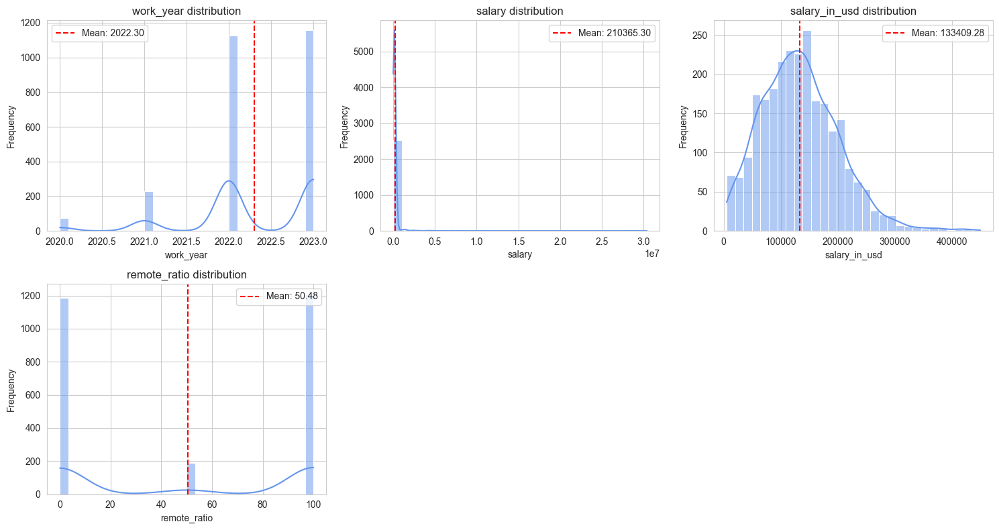

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
df_numbers = df.select_dtypes([int, float]).columns

cols = 3
rows = -(-len(df_numbers) // cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

for i, col in enumerate(df_numbers):
    ax = axes[i]
    sns.histplot(df[col], bins=30, kde=True, color='cornflowerblue', ax=ax)
    ax.set_title(f'{col} distribution', fontsize=12)
    ax.set_xlabel(col, fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.axvline(df[col].mean(), color='red', linestyle='dashed', linewidth=1.5, label=f'Mean: {df[col].mean():.2f}')
    ax.legend()

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

<AxesSubplot: >

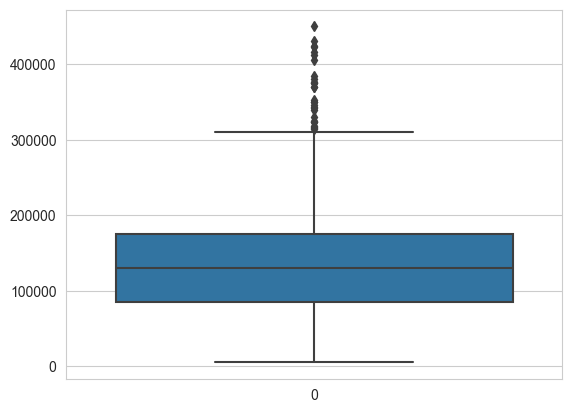

In [ ]:
sns.boxplot(df.salary_in_usd)

Выбросов пристутствуют в целевой переменной

## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

In [ ]:
df = df.drop(["salary", "salary_currency"], axis=1)

In [ ]:
for col in df.columns.tolist():
    print(col, df[col].nunique())

work_year 4
experience_level 4
employment_type 4
job_title 93
salary_in_usd 1035
employee_residence 78
remote_ratio 3
company_location 72
company_size 3


**Ваши выводы здесь**

1. Лишние признаки:

* salary – это зарплата в оригинальной валюте, а у нас целевая переменная salary_in_usd (удаляем, так как она уже переведена в единую валюту).
* salary_currency – не нужен, так как все зарплаты уже приведены к USD.

  Оставшиеся признаки релевантны, так как они могут влиять на уровень зарплаты (опыт, тип занятости, локация и т. д.).

2. job_title, salary_currency, employee_residence, company_location имеют много категорий

## **Задание 4 (0.2 балла)**

Разделите выборку на train, test (80%, 20%).

In [ ]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(df.drop('salary_in_usd', axis=1), df.salary_in_usd, test_size=0.2, random_state=42)

## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовьте всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделите данные для тренировки и теста для непрерывных признаков
- Выделите данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируйте.

In [ ]:
Xtrain_numeric, Xtest_numeric = Xtrain.select_dtypes(include=['int', 'float']), Xtest.select_dtypes(include=['int', 'float'])

Так как непрерывных я не нашла, то решила сделать просто на числовых признаках

## **Задание 6 (0.2 балла)**

- Обучите модель линейной регресии на числовых признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.preprocessing import StandardScaler

# функция для высчитывания метрик
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    return {"model": model_name, "MAPE": mape, "RMSE": rmse}

In [ ]:
st = StandardScaler()
X_train_scaler = st.fit_transform(Xtrain_numeric)
X_test_scaler = st.transform(Xtest_numeric)
lr = LinearRegression()
lr.fit(X_train_scaler, ytrain)
evaluate_model(lr, X_test_scaler, ytest, "LinearRegression")

{'model': 'LinearRegression',
 'MAPE': 0.8290566399557715,
 'RMSE': 64000.53262564968}

Ошибка довольно-таки большая, модель плохо работает, что не очень хороши и необходимы категориальные признаки

## **Задание 8 (0.2 балла)**

- Обучите модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [ ]:
from catboost import CatBoostRegressor

catboost = CatBoostRegressor(logging_level='Silent')
catboost.fit(X_train_scaler, ytrain)
evaluate_model(catboost, X_test_scaler, ytest, "CatBoostRegressor")

{'model': 'CatBoostRegressor',
 'MAPE': 0.7708443769690209,
 'RMSE': 62433.34798150245}

Также как и в линейной регрессии ошибка довольно-таки большая, но результаты метрик лучше, чем у линейной регрессии

## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попроубем разные стратегии предобработки.

**1:**
- Предобработайте категориальные признаки при помощи OHE
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**2:**
- Предобработайте категориальные признаки при помощи LabelEncoding
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**3:**
- Предобработайте категориальные признаки при помощи MeanTargetEnc
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

In [ ]:
results = []
columns = list(Xtrain.select_dtypes(include=['object']).columns)
columns.append('remote_ratio')

In [ ]:
from sklearn.preprocessing import LabelEncoder, TargetEncoder
import numpy as np

#one
def one_enc(Xtrain, Xtest, columns):
    X_train_ohe = pd.get_dummies(Xtrain, columns=columns, drop_first=True, dtype = int)
    X_test_ohe = pd.get_dummies(Xtest, columns=columns, drop_first=True, dtype = int)
    X_test_ohe = X_test_ohe.reindex(columns=X_train_ohe.columns, fill_value=0) # столбцы X_test_ohe должны совпадать с X_train_ohe
    st = StandardScaler()
    X_train_ohe = st.fit_transform(X_train_ohe)
    X_test_ohe = st.transform(X_test_ohe)
    return X_train_ohe, X_test_ohe
X_train_ohe, X_test_ohe = one_enc(Xtrain, Xtest, columns)
# Обучаем CatBoost и линейную регрессию
cb_ohe = CatBoostRegressor(logging_level='Silent')
cb_ohe.fit(X_train_ohe, ytrain)
lr_ohe = LinearRegression()
lr_ohe.fit(X_train_ohe, ytrain)
results.append(evaluate_model(cb_ohe, X_test_ohe, ytest, "CatBoost (OHE)"))
results.append(evaluate_model(lr_ohe, X_test_ohe, ytest, "Linear Regression (OHE)"))

In [ ]:
# Label Encoding
def label_enc(Xtrain, Xtest, columns):
    X_train_le = Xtrain.copy()
    X_test_le = Xtest.copy()
    le_dict = {}
    le = LabelEncoder()
    for col in columns:
        X_train_le[col] = le.fit_transform(Xtrain[col])
        le_dict[col] = dict(zip(le.classes_, le.transform(le.classes_)))  # Сохраняем кодировки
        # Применяем map(), а неизвестные категории заменяем на -1
        X_test_le[col] = Xtest[col].map(le_dict[col]).fillna(-1).astype(int)
    st = StandardScaler()
    X_train_le = st.fit_transform(X_train_le)
    X_test_le = st.transform(X_test_le)
    return X_train_le, X_test_le
X_train_le, X_test_le = label_enc(Xtrain, Xtest, columns)
# Обучаем CatBoost и линейную регрессию
cb_le = CatBoostRegressor(logging_level='Silent')
cb_le.fit(X_train_le, ytrain)
lr_le = LinearRegression()
lr_le.fit(X_train_le, ytrain)
results.append(evaluate_model(cb_le, X_test_le, ytest, "CatBoost (Label Encoding)"))
results.append(evaluate_model(lr_le, X_test_le, ytest, "Linear Regression (Label Encoding)"))

In [ ]:
# Mean Target Encoding
def target_enc(Xtrain, Xtest, columns):
    te = TargetEncoder()  # Убираем аргумент `cols`
    X_train_te = te.fit_transform(Xtrain[columns], ytrain)
    X_test_te = te.transform(Xtest[columns])

    st = StandardScaler()
    X_train_te = st.fit_transform(X_train_te)
    X_test_te = st.transform(X_test_te)
    return X_train_te, X_test_te
X_train_te, X_test_te = target_enc(Xtrain, Xtest, columns)
# Обучаем CatBoost и линейную регрессию
cb_te = CatBoostRegressor(logging_level='Silent')
cb_te.fit(X_train_te, ytrain)
lr_te = LinearRegression()
lr_te.fit(X_train_te, ytrain)
results.append(evaluate_model(cb_te, X_test_te, ytest, "CatBoost (Mean Target Encoding)"))
results.append(evaluate_model(lr_te, X_test_te, ytest, "Linear Regression (Mean Target Encoding)"))

In [ ]:
# Создаем DataFrame с результатами
df_results = pd.DataFrame(results).sort_values(by="MAPE")
df_results

,model,MAPE,RMSE
0,CatBoost (OHE),0.425288,5.217745e+04
4,CatBoost (Mean Target Encoding),0.429506,5.162672e+04
1,Linear Regression (OHE),0.452459,5.350704e+04
2,CatBoost (Label Encoding),0.566719,5.560714e+04
3,Linear Regression (Label Encoding),0.571788,5.593166e+04
5,Linear Regression (Mean Target Encoding),856.179630,1.826066e+09


Самый лучший результат достигается при использовании MeanTargetEncoding и CatBoost, а самый худший при использовании линейной регрессии с той же кодировкой. Качество всех моделей с использованием категориальных признаков (кроме Linear Regression (Mean Target Encoding)) значительно улучшилось, но при этом ошибка всё также довольно-таки большая

## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

In [ ]:
y_pred = cb_le.predict(X_test_le)

# Вычисляем абсолютные ошибки
errors = np.abs(ytest - y_pred)

# Создаем DataFrame с ошибками
df_errors = Xtest.copy()
df_errors["actual_salary"] = ytest
df_errors["predicted_salary"] = y_pred
df_errors["abs_error"] = errors

# Выводим топ 20 примеров с наибольшей ошибкой
df_errors_top20 = df_errors.sort_values(by="abs_error", ascending=False).head(20)
df_errors_top20

,work_year,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size,actual_salary,predicted_salary,abs_error
2011,2022,MI,FT,Data Analyst,GB,0,GB,M,430967,64061.497318,366905.502682
1288,2023,SE,FT,Data Analyst,US,0,US,M,385000,133354.931200,251645.068800
2578,2021,EN,FT,Power BI Developer,IN,50,IN,L,5409,240852.243390,235443.243390
2655,2022,SE,FT,Principal Data Architect,IN,100,IN,L,38154,270224.093418,232070.093418
2022,2022,SE,FT,3D Computer Vision Researcher,CA,50,AL,S,10000,206333.768207,196333.768207
2295,2022,SE,FT,Data Management Specialist,IT,0,IT,L,68293,246149.177078,177856.177078
1695,2023,SE,FT,Applied Scientist,US,0,US,L,72000,236192.500699,164192.500699
1821,2022,SE,FT,Manager Data Management,US,100,US,L,125000,286763.021250,161763.021250
2406,2022,SE,FT,Data Engineer,US,100,US,M,315000,158268.995695,156731.004305
30,2023,SE,FT,Data Strategist,CA,0,CA,M,72000,217343.654955,145343.654955


Больше всего модель ошибается при аномальных зарплатах. Решением является добавление новых признаков определяющий зарплату, например country_salary_median — медианная зарплата в стране и подбор гиперпарамметров в CatBoost.

## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качетсво модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [ ]:
country_salary_median = Xtrain.copy()
country_salary_median["median_salary"] = ytrain
country_salary_median = country_salary_median.groupby("employee_residence")["median_salary"].median()
X_train_enhanced = Xtrain.copy()
X_test_enhanced = Xtest.copy()
X_train_enhanced["country_salary_median"] = X_train_enhanced["employee_residence"].map(country_salary_median)
X_test_enhanced["country_salary_median"] = X_test_enhanced["employee_residence"].map(country_salary_median)
X_test_enhanced["country_salary_median"].fillna(X_train_enhanced["country_salary_median"].median(), inplace=True)
X_train_enhanced.drop("employee_residence", axis=1)
X_test_enhanced.drop("employee_residence", axis=1)
columns_new = list(Xtrain.select_dtypes(include=['object']).columns)
columns_new.append('remote_ratio')
results = []

In [ ]:
X_train_ohe_new, X_test_ohe_new = one_enc(X_train_enhanced, X_test_enhanced, columns_new)
# Обучаем CatBoost и линейную регрессию
cb_ohe = CatBoostRegressor(logging_level='Silent')
cb_ohe.fit(X_train_ohe_new, ytrain)
lr_ohe = LinearRegression()
lr_ohe.fit(X_train_ohe_new, ytrain)
results.append(evaluate_model(cb_ohe, X_test_ohe_new, ytest, "CatBoost (OHE)"))
results.append(evaluate_model(lr_ohe, X_test_ohe_new, ytest, "Linear Regression (OHE)"))

In [ ]:
X_train_le_new, X_test_le_new = label_enc(X_train_enhanced, X_test_enhanced, columns_new)
# Обучаем CatBoost и линейную регрессию
cb_le = CatBoostRegressor(logging_level='Silent')
cb_le.fit(X_train_le_new, ytrain)
lr_le = LinearRegression()
lr_le.fit(X_train_le_new, ytrain)
results.append(evaluate_model(cb_le, X_test_le_new, ytest, "CatBoost (Label Encoding)"))
results.append(evaluate_model(lr_le, X_test_le_new, ytest, "Linear Regression (Label Encoding)"))

In [ ]:
X_train_te_new, X_test_te_new = target_enc(X_train_enhanced, X_test_enhanced, columns_new)
# Обучаем CatBoost
# Обучаем CatBoost и линейную регрессию
cb_te = CatBoostRegressor(logging_level='Silent')
cb_te.fit(X_train_te_new, ytrain)
lr_te = LinearRegression()
lr_te.fit(X_train_te_new, ytrain)
results.append(evaluate_model(cb_te, X_test_te_new, ytest, "CatBoost (Mean Target Encoding)"))
results.append(evaluate_model(lr_te, X_test_te_new, ytest, "Linear Regression (Mean Target Encoding)"))

In [ ]:
# Создаем DataFrame с результатами
df_results = pd.DataFrame(results).sort_values(by="MAPE")
df_results

,model,MAPE,RMSE
4,CatBoost (Mean Target Encoding),0.400781,5.134370e+04
0,CatBoost (OHE),0.430394,5.313915e+04
1,Linear Regression (OHE),0.452941,5.350078e+04
3,Linear Regression (Label Encoding),0.469356,5.483979e+04
2,CatBoost (Label Encoding),0.574146,5.587778e+04
5,Linear Regression (Mean Target Encoding),67.310702,3.881967e+07


**Ваш ответ здесь**.

При замене страны на числовой признак country_salary_median — медианная зарплата в стране качество моделей улучшилось

## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [ ]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import time
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

Модель обучена выше - cb_te

In [ ]:
results = []
start_time = time.time()
catboost_model = CatBoostRegressor(logging_level="Silent")

param_grid = {
    "iterations": [500, 1000, 1500],  # Количество деревьев
    "depth": [4, 6, 8, 10],  # Глубина деревьев
    "learning_rate": [0.01, 0.1, 1],  # Скорость обучения
}

# Запускаем RandomizedSearchCV
random_search = RandomizedSearchCV(
    catboost_model, param_grid, scoring="neg_mean_absolute_percentage_error", cv=3, verbose=1, n_jobs=-1
)

random_search.fit(X_train_te_new, ytrain)
end_time = time.time() - start_time
print("Время выполнения CatBoost: ", end_time)
print("Лучшие параметры CatBoost:", random_search.best_params_)

# Оцениваем модель с лучшими параметрами
best_cb = random_search.best_estimator_

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Время выполнения CatBoost:  10621.467761278152
Лучшие параметры CatBoost: {'learning_rate': 0.01, 'iterations': 1000, 'depth': 6}


In [ ]:
start_time = time.time()
best_cb.fit(X_train_te_new, ytrain)
end_time_pred = time.time() - start_time
start_time = time.time()
pred_cb = best_cb.predict(X_test_te_new)
end_time = time.time() - start_time
results.append(evaluate_model(best_cb, X_test_te_new, ytest, "Best CatBoost"))

In [ ]:
print("Время обучения CatBoost: ", end_time_pred)
print("Время предсказания CatBoost: ", end_time)

Время обучения CatBoost:  103.46451735496521
Время предсказания CatBoost:  0.6810712814331055


## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



In [ ]:
xgb_te = XGBRegressor(verbosity=0)
xgb_te.fit(X_train_te_new, ytrain)
evaluate_model(xgb_te, X_test_te_new, ytest, "XGBBoost (Mean Target Encoding)")

{'model': 'XGBBoost (Mean Target Encoding)',
 'MAPE': 0.4392596120875821,
 'RMSE': 55876.40388727447}

In [ ]:
start_time = time.time()

xgb_model = XGBRegressor(verbosity=0)

param_grid_xgb = {
    "n_estimators": [500, 1000, 1500],  # Количество деревьев
    "max_depth": [4, 6, 8, 10],  # Глубина деревьев
    "learning_rate": [0.01, 0.1, 1],  # Скорость обучения
}

random_search_xgb = RandomizedSearchCV(
    xgb_model, param_grid_xgb, scoring="neg_mean_absolute_percentage_error", cv=3, verbose=1, n_jobs=-1
)

random_search_xgb.fit(X_train_te_new, ytrain)
end_time = time.time() - start_time
print("Время выполнения XGBoost:", end_time)
print("Лучшие параметры XGBoost:", random_search_xgb.best_params_)

# Оцениваем модель с лучшими параметрами
best_xgb = random_search_xgb.best_estimator_
results.append(evaluate_model(best_xgb, X_test_te_new, ytest, "Best XGBoost"))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Время выполнения XGBoost: 1314.2204823493958
Лучшие параметры XGBoost: {'n_estimators': 1500, 'max_depth': 6, 'learning_rate': 0.01}


In [ ]:
start_time = time.time()
best_xgb.fit(X_train_te_new, ytrain)
end_time_pred = time.time() - start_time
start_time = time.time()
pred_xgb = best_xgb.predict(X_test_te_new)
end_time = time.time() - start_time
results.append(evaluate_model(best_xgb, X_test_te_new, ytest, "Best XGBoost"))

In [ ]:
print("Время обучения XGBoost: ", end_time_pred)
print("Время предсказания XGBoost: ", end_time)

Время обучения XGBoost:  60.188061475753784
Время предсказания XGBoost:  0.050582170486450195


## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [ ]:
lgbm_te = LGBMRegressor()
lgbm_te.fit(X_train_te_new, ytrain)

In [ ]:
evaluate_model(lgbm_te, X_test_te_new, ytest, "LGBMBoost (Mean Target Encoding)")

{'model': 'LGBMBoost (Mean Target Encoding)',
 'MAPE': 0.3958525849941075,
 'RMSE': 52742.30140184321}

In [ ]:
start_time = time.time()

lgbm_model = LGBMRegressor()

param_grid_lgbm = {
    "n_estimators": [500, 1000, 1500],  # Количество деревьев
    "max_depth": [4, 6, 8, 10],  # Глубина деревьев
    "learning_rate": [0.01, 0.1, 1],  # Скорость обучения
    "num_leaves": [20, 31, 40, 50],  # Количество листьев в дереве
}

random_search_lgbm = RandomizedSearchCV(
    lgbm_model, param_grid_lgbm, scoring="neg_mean_absolute_percentage_error",
    cv=3, verbose=1, n_jobs=-1
)

random_search_lgbm.fit(X_train_te_new, ytrain)
end_time = time.time() - start_time

In [ ]:
print("Время выполнения LightGBM:", end_time)
print("Лучшие параметры LightGBM:", random_search_lgbm.best_params_)

# Оцениваем модель с лучшими параметрами
best_lgbm = random_search_lgbm.best_estimator_
results.append(evaluate_model(best_lgbm, X_test_te_new, ytest, "Best LightGBM"))

Время выполнения LightGBM: 536.2078881263733
Лучшие параметры LightGBM: {'num_leaves': 40, 'n_estimators': 1000, 'max_depth': 8, 'learning_rate': 0.01}


In [ ]:
start_time = time.time()
best_lgbm.fit(X_train_te_new, ytrain)
end_time_pred = time.time() - start_time
start_time = time.time()
pred_lgbm = best_lgbm.predict(X_test_te_new)
end_time = time.time() - start_time
results.append(evaluate_model(best_lgbm, X_test_te_new, ytest, "Best LightGBM"))

In [ ]:
print("Время обучения LightGBM: ", end_time_pred)
print("Время предсказания LightGBM: ", end_time)

Время обучения LightGBM:  34.100839614868164
Время предсказания LightGBM:  0.036499977111816406


## **Задание 15 (0.4 балла)**

In [ ]:
# Выводим обновленный DataFrame с результатами
df_results = pd.DataFrame(results).sort_values(by="MAPE")
df_results

,model,MAPE,RMSE
1,Best LightGBM,0.393539,52255.605417
2,Best XGBoost,0.411407,52300.411893
0,Best CatBoost,0.428216,51041.272550


Сделайте выводы про модели и решение задачи.

**1. Какая из моделей показала лучший результат по качеству?**
* LGBM показала самый низкий результат MAPE (0.3935), но при этом CatBoost показал самый низкий результат RMSE (~51041.2).

**2. Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?**
* LGBM обучается (≈32 с) и предсказывает (≈0.03 с) быстрее всех, плюс качество её предсказаний на уровне лучших, что, с учетом всех критериев, говорит нам о том, что LGBM – оптимальный выбор.

**3. Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?**
* Бустинговые модели существенно превзошли линейную регрессию (например, RMSE снизилось с ≈64000 до ≈51041, а MAPE улучшилось с ≈77% до ≈39%), что говорит об их высокой целесообразности в использовании (в нашей задаче).

# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

In [ ]:
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [ ]:
X_train = np.loadtxt("samsung_train.txt")
X_test = np.loadtxt("samsung_test.txt")
y_train = np.loadtxt("samsung_train_labels.txt", dtype=int)
y_test = np.loadtxt("samsung_test_labels.txt", dtype=int)

X = np.vstack([X_train, X_test])
y = np.concatenate([y_train, y_test])

In [ ]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1, 2, 3, 4, 5, 6])

### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(random_state=RANDOM_STATE)
X_pca = pca.fit_transform(X_scaled)

# Находим количество компонент для объяснения ≥90% дисперсии
explained_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(explained_variance >= 0.9) + 1  # Количество нужных компонент

print(f"Количество компонент для 90% дисперсии: {n_components}")

# Повторно применяем PCA с нужным числом компонент
pca_final = PCA(n_components=n_components, random_state=RANDOM_STATE)
X_reduced = pca_final.fit_transform(X_scaled)

print(f"Размерность после PCA: {X_reduced.shape}")

Количество компонент для 90% дисперсии: 65
Размерность после PCA: (10299, 65)


### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

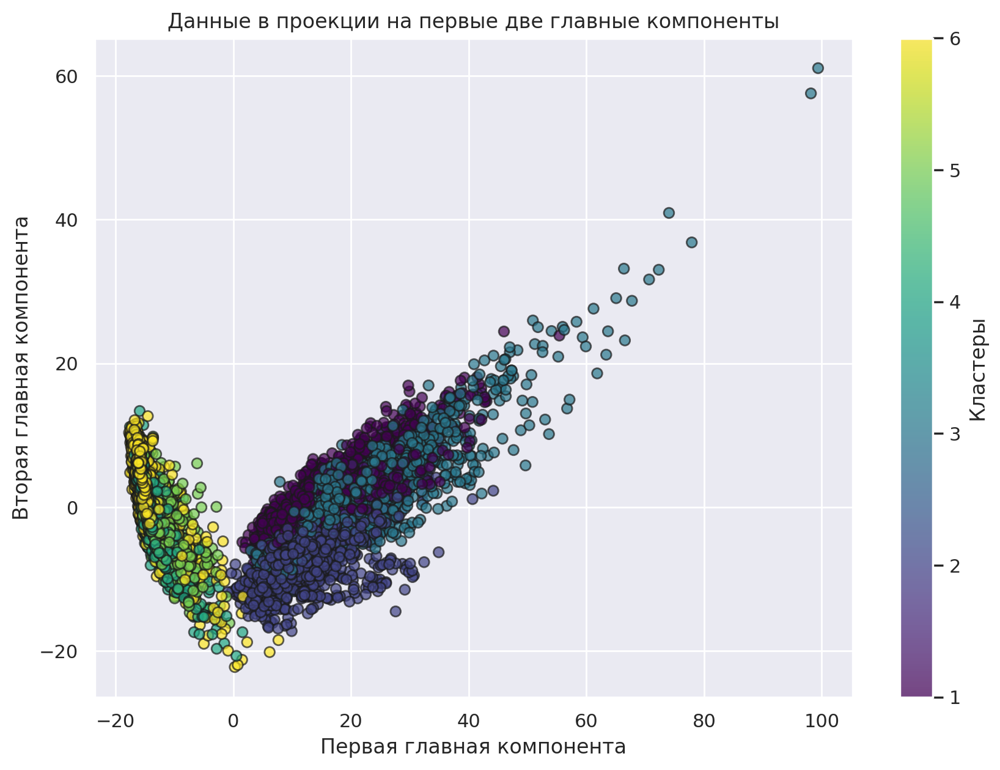

In [ ]:
# Визуализируем данные
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=y, cmap="viridis", alpha=0.7, edgecolors="k"
)

plt.colorbar(scatter, label="Кластеры")
plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Данные в проекции на первые две главные компоненты")
plt.grid(True)
plt.show()

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Засекаем время обучения KMeans
start_time_train = time.time()
kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)
kmeans.fit(X_pca)
train_time = time.time() - start_time_train

# Засекаем время предсказания кластеров
start_time_infer = time.time()
clusters = kmeans.predict(X_pca)
infer_time = time.time() - start_time_infer

# Вывод результатов
print(f"Время обучения KMeans: {train_time:.4f} сек.")
print(f"Время инференса KMeans: {infer_time:.4f} сек.")

Время обучения KMeans: 31.4832 сек.
Время инференса KMeans: 0.0162 сек.


### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

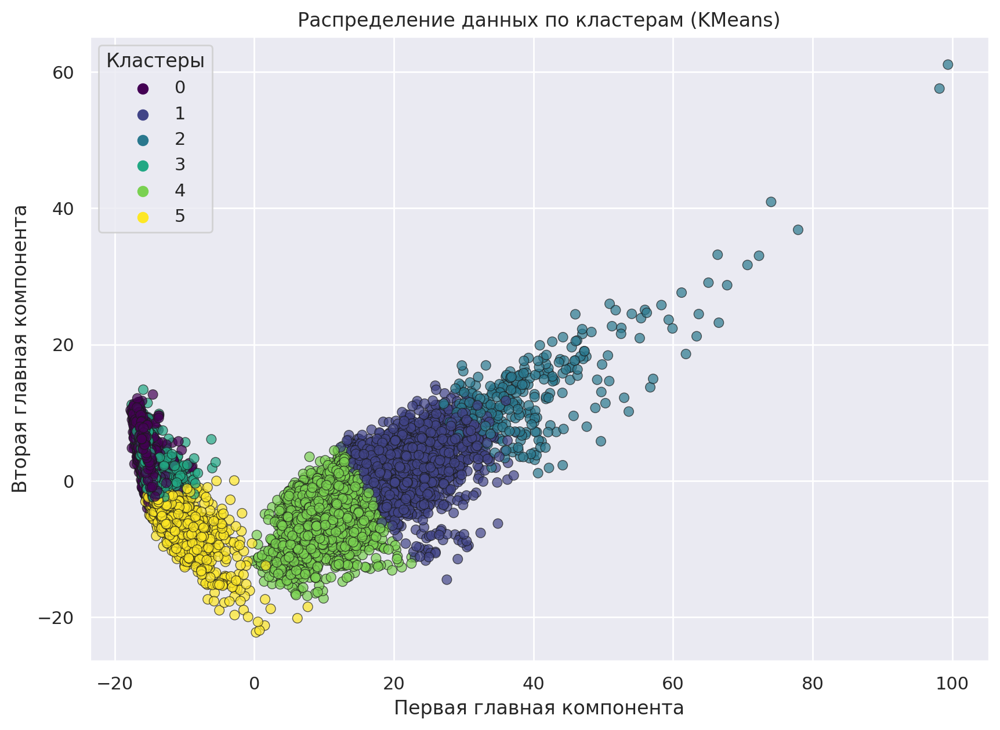

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca[:, 0], y=X_pca[:, 1], hue=clusters, palette="viridis", alpha=0.7, edgecolor="k"
)
plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Распределение данных по кластерам (KMeans)")
plt.legend(title="Кластеры")
plt.grid(True)
plt.show()

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari = adjusted_rand_score(np.array(y), np.array(clusters))
nmi = normalized_mutual_info_score(np.array(y), np.array(clusters))

print("ARI:", ari)
print("NMI:", nmi)# Ваш код здесь

ARI: 0.419224271062724
NMI: 0.559876877030279


**Ваш вывод здесь**

* `ARI` (Adjusted Rand Index) - корректирует случайное совпадение, измеряя согласованность пар точек между истинными метками и предсказанными кластерами.
* `NMI` (Normalized Mutual Information) - нормализует взаимную информацию, показывая, сколько информации о настоящем разбиении содержится в предсказанной кластеризации, независимо от количества и размеров кластеров.

**По метрикам видно, что полученная кластеризация имеет умеренное соответствие истинным меткам. `ARI` указывает на то, что кластеризация превосходит случайное разделение, а `NMI` говорит о том, что примерно 56% информации о разбиении соответствует предсказанной кластеризации.**

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

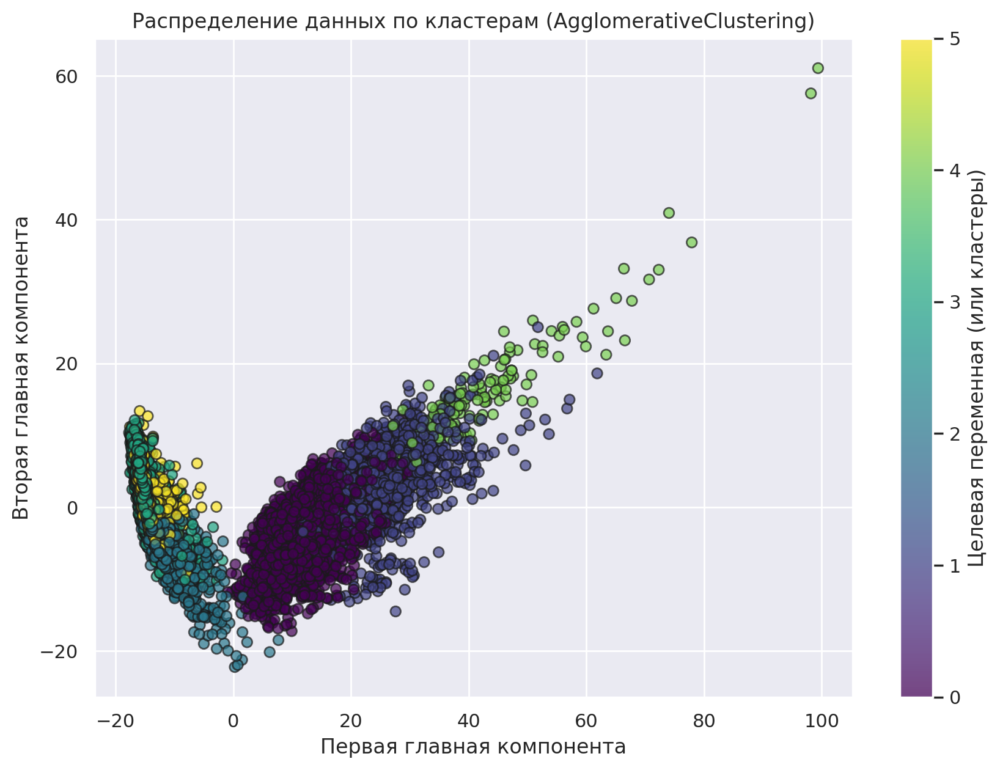

In [ ]:
from sklearn.cluster import AgglomerativeClustering

start_train = time.time()
agg = AgglomerativeClustering(n_clusters=6)
agg_labels = agg.fit_predict(X_pca)
train_time_agg = time.time() - start_train

plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1], c=agg_labels, cmap="viridis", alpha=0.7, edgecolors="k"
)

plt.colorbar(scatter, label="Целевая переменная (или кластеры)")
plt.xlabel("Первая главная компонента")
plt.ylabel("Вторая главная компонента")
plt.title("Распределение данных по кластерам (AgglomerativeClustering)")
plt.grid(True)
plt.show()

In [ ]:
ari_agg = adjusted_rand_score(y, agg_labels)
nmi_agg = normalized_mutual_info_score(y, agg_labels)
print("AgglomerativeClustering ARI:", ari_agg)
print("AgglomerativeClustering NMI:", nmi_agg)
print(f"Время обучения: {train_time}")

AgglomerativeClustering ARI: 0.459874890109388
AgglomerativeClustering NMI: 0.6014981965896593
Время обучения: 26.337201833724976


**Ваш вывод здесь**

* Агломеративная кластеризация дает получше результаты, чем с KMeans, как по качеству, так и по времени.

* Это можно объяснить тем, что агломеративный метод возможно лучше улавливает иерархическую структуру данных, что позволяет точнее разделять группы.

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Ваш вывод здесь**

1. Да. В основном каждый кластер группирует одну активность (бег, ходьбу, сидение и т. д.).

2. Кластеры 1 и 2 слегка пересекаются: подъём/спуск по лестнице и ходьба могут выдавать похожие сенсорные данные, поэтому они частично объединяются.

3. Да, метрики ARI/NMI и визуализация показывают, что основные активности хорошо отделены, хотя в «динамичных» движениях есть небольшое смешивание.

## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

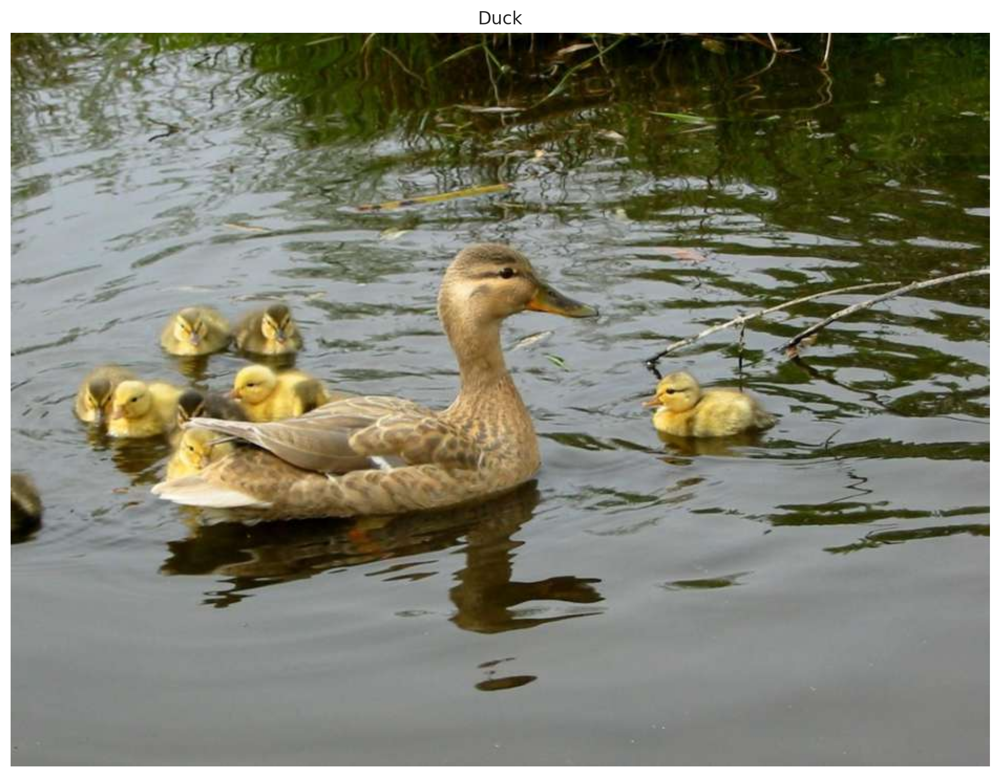

In [ ]:
from PIL import Image

duck_img = Image.open('duck.jpg')
plt.imshow(duck_img)
plt.title("Duck")
plt.axis('off')
plt.show()

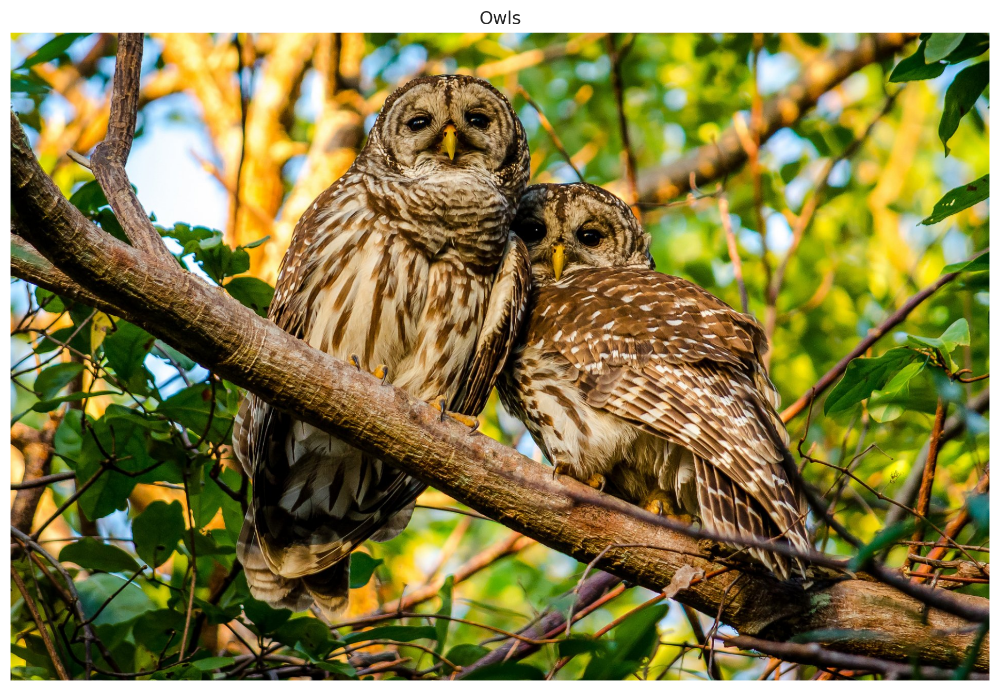

In [ ]:
owls_img = Image.open('owls.jpg')
plt.imshow(owls_img)
plt.title("Owls")
plt.axis('off')
plt.show()

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [ ]:
def find_components(image, lmbd, n_clusters):
    img = np.array(image)
    h, w, _ = img.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    feats = np.column_stack((lmbd * x.flatten(), lmbd * y.flatten(), img.reshape(-1, 3)))
    labels = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(feats)
    return labels.reshape(h, w)

seg_duck = find_components(duck_img, 0.3, 100)
seg_owls = find_components(owls_img, 1.5, 100)

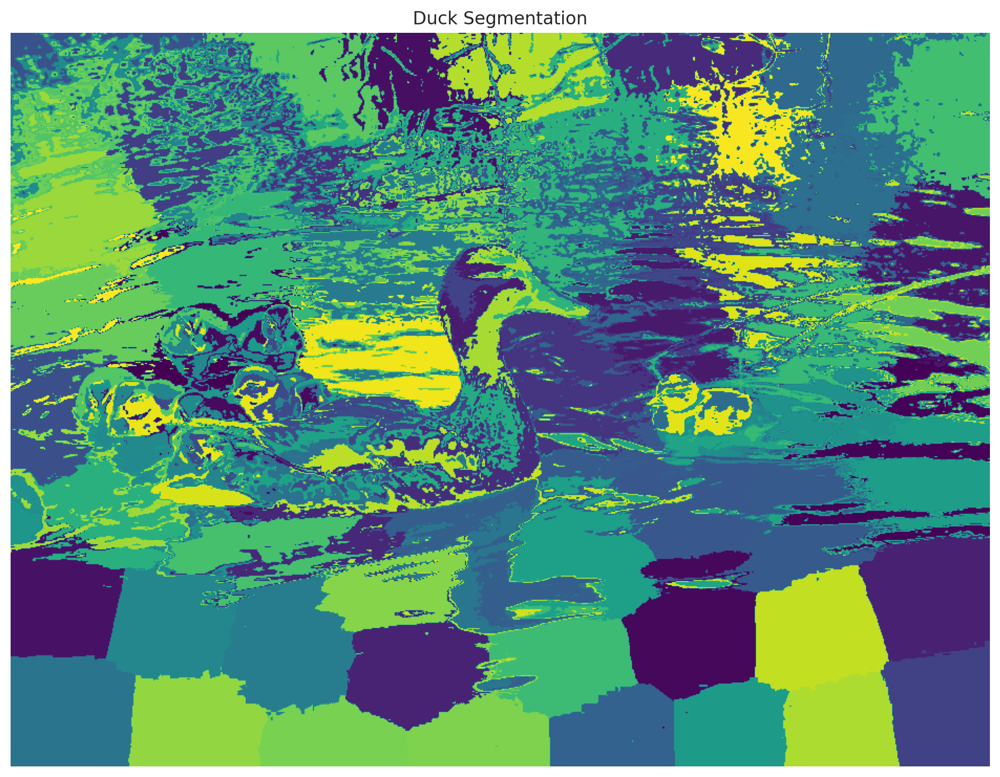

In [ ]:
plt.imshow(seg_duck, cmap='viridis')
plt.title("Duck Segmentation")
plt.axis('off')
plt.show()

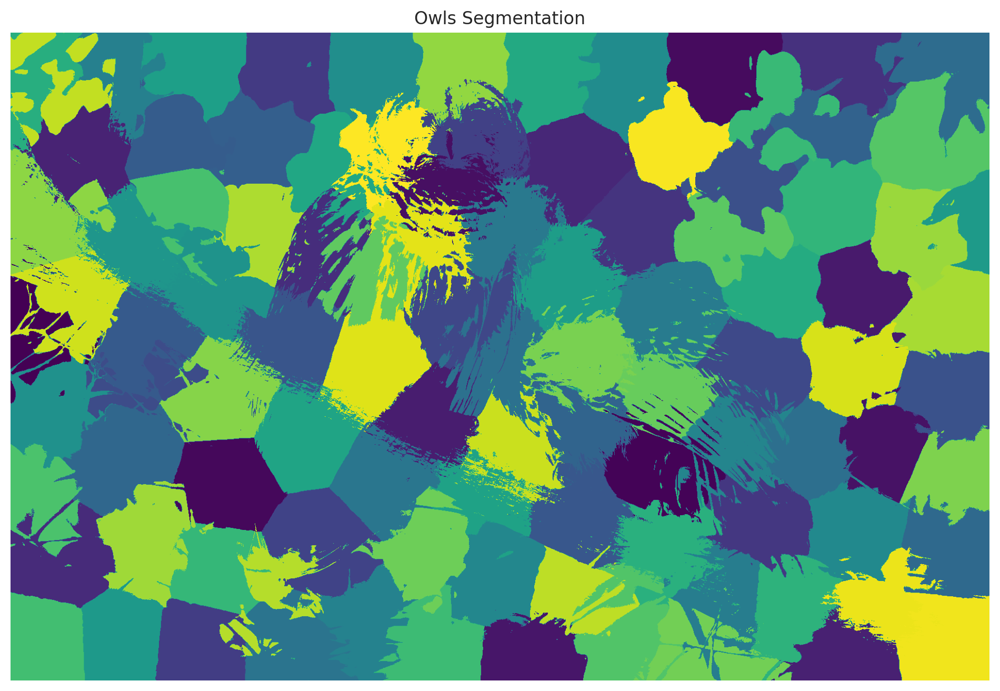

In [ ]:
plt.imshow(seg_owls, cmap='viridis')
plt.title("Owls Segmentation")
plt.axis('off')
plt.show()

### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [ ]:
import cv2
from sklearn.cluster import SpectralClustering

def spectral_segmentation(image, n_clusters, beta, eps):
    img = np.array(image)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    small = cv2.resize(gray, (gray.shape[1]//5, gray.shape[0]//5))
    h, w = small.shape
    x, y = np.meshgrid(np.arange(w), np.arange(h))
    feats = np.column_stack((beta * x.flatten(), beta * y.flatten(), small.flatten()))
    labels = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42).fit_predict(feats)
    return labels.reshape(h, w)

spec_duck = spectral_segmentation(duck_img, 50, beta=1.0, eps=0)
spec_owls = spectral_segmentation(owls_img, 50, beta=1.0, eps=0)

### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

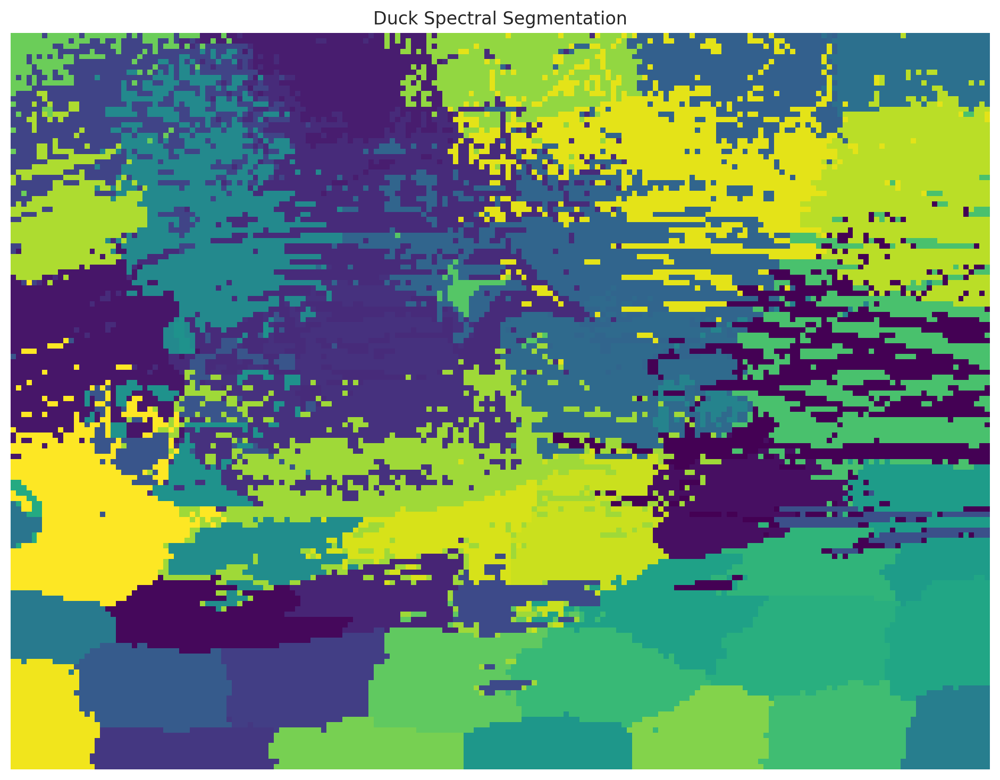

In [ ]:
plt.imshow(spec_duck, cmap='viridis')
plt.title("Duck Spectral Segmentation")
plt.axis('off')
plt.show()

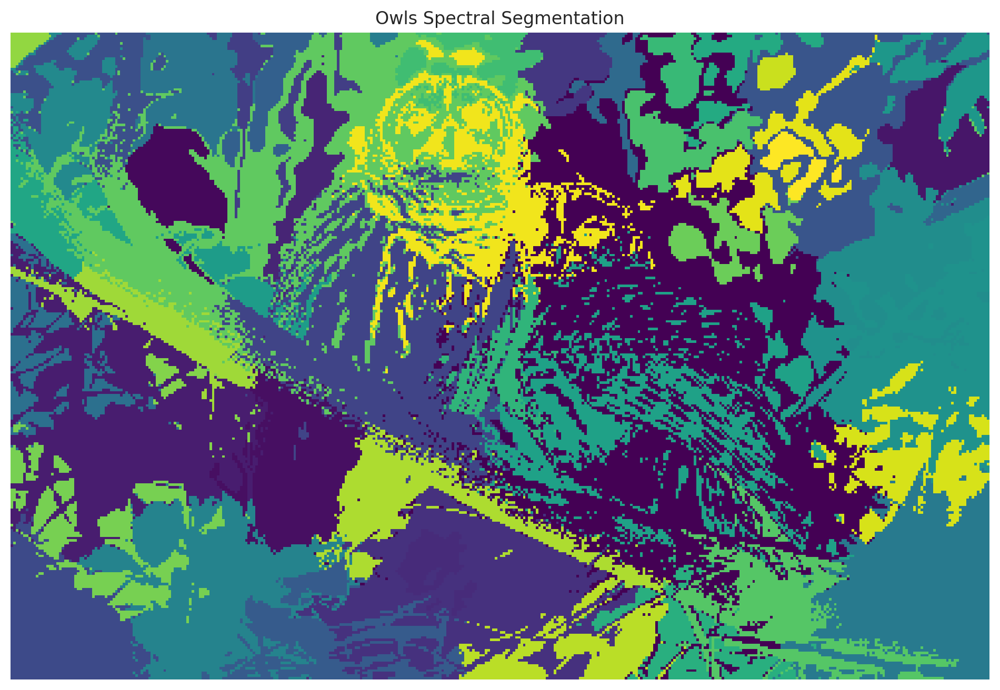

In [ ]:
plt.imshow(spec_owls, cmap='viridis')
plt.title("Owls Spectral Segmentation")
plt.axis('off')
plt.show()

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный котобонус :)

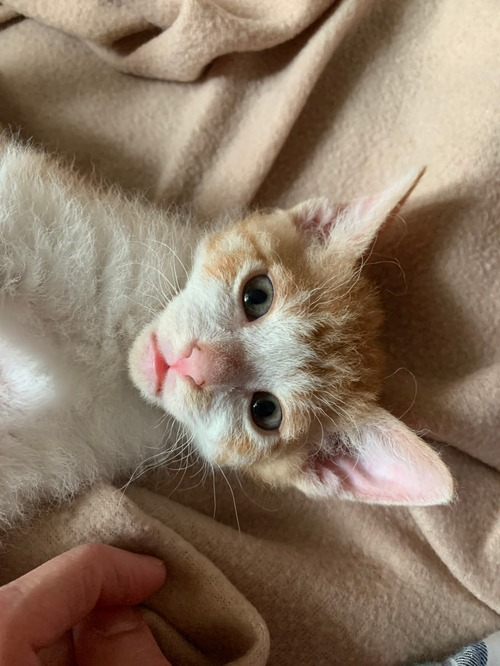

Я думаю, что этот кот принадлежит Елене